# Synthetic Data Generation

### Synthetic data from real data

합성 데이터 생성은 데이터 요구 사항 증가와 데이터에 대한 프라이버시 문제 등으로 인해 주목받고 있는 분야이다. 은닉 마르코프 모델(HMM), GAN 등은 합성 데이터를 생성하는 대표적인 모델 중 하나이다. 

합성 데이터는 실제 데이터의 통계적 특성을 모방하는 과정에서 생성된 데이터이다. 데이터는 원 데이터로부터 모델링되어야 한다는 믿음이 있지만, 반드시 실제 데이터에서 합성 데이터를 생성하는 것 만이 유일한 방법은 아니다. 합성 데이터를 생성하는 방법에는 세 가지 방법이 알려져 있다.

1. 실제 데이터를 이용해 합성 데이터를 생성하는 방법. 이 프로세스는 실제 데이터를 가져오는 것에서 시작해 데이터 분포를 모델링하고 마지막으로 해당 분포 모델로부터 합성 데이터를 샘플링한다.

2. 합성 데이터는 모델 또는 지식으로부터 얻을 수 있다. 일반적으로 이러한 유형의 합성 데이터 생성은 기존 모델을 사용하거나 연구자의 지식을 바탕으로 생성된다.

3. 하이브리드 프로세스는 앞의 두 단계를 모두 포함한다. 이런 하이브리드 프로세스는 데이터의 일부만 사용 가능할 때 많이 적용되며, 실제 데이터로 합성 데이터를 일부 생성한 뒤 나머지 부분을 모델로부터 얻어온다.

그렇다면 합성 데이터의 품질은 어떻게 평가할 수 있을까? 일반적으로는 KL-분산, 구별 가능성(Distinguishable), ROC 곡선, 평균&중앙값 4가지 방법론이 사용된다. 

구별 가능성(Distinguishable)은 분류 모델이 실제 데이터와 합성 데이터를 구분하는 경우 실제 데이터에 1을 할당한다. 만일 실제 데이터와 합성 데이터를 구분하지 못한다면 0을 할당한다. 출력이 1에 가까우면 데이터는 실제라고 예측하고, 그렇지 않으면 성향 점수(Propensity score)를 사용해 합성 데이터라고 예측한다.

혹은 실제 데이터와 합성 데이터의 평균과 분산과 같이 주요 통계량을 이용해 합성 데이터가 실제 데이터를 잘 모방하는지 파악할 수 있다.

데이터 합성을 위해 우선 실제 데이터를 불러온다.

In [1]:
from sklearn.datasets import fetch_california_housing
import pandas as pd
import numpy as np
import matplotlib. pyplot as plt
import yfinance as yf
import datetime
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [2]:
X, y = fetch_california_housing(return_X_y=True)

In [3]:
california_housing=np.column_stack([X, y])
california_housing_df=pd.DataFrame(california_housing)
california_housing_df=california_housing_df.sample(2000)

In [4]:
california_housing_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2000 entries, 10684 to 20462
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       2000 non-null   float64
 1   1       2000 non-null   float64
 2   2       2000 non-null   float64
 3   3       2000 non-null   float64
 4   4       2000 non-null   float64
 5   5       2000 non-null   float64
 6   6       2000 non-null   float64
 7   7       2000 non-null   float64
 8   8       2000 non-null   float64
dtypes: float64(9)
memory usage: 156.2 KB


여기서는 생성적 적대 네트워크를 이용해 합성 데이터를 만들어내는 방법에 대해 다룬다.

### 생성적 적대 네트워크(GAN)

생성적 적대 네트워크(이하 GAN)는 두가지 모델로 이뤄져 있다. 하나는 데이터를 합성하는 모델이며, 하나는 입력받은 데이터가 합성된 데이터인지, 아니면 실제 데이터인지 판별하는 모델이다. GAN은 데이터를 합성한 뒤 (혹은 그냥 진짜 데이터를) 판별 모델이 받아 실제인지 합성인지 판별하고 이를 다시 합성 모델에 전달하는 식으로 훈련이 진행된다. 현금 위조범과 위조 판별사를 생각해보자. 현금 위조범의 첫 결과물은 너무 조잡하여 위조 판별사는 간단하게 실제 현금과 위조 현금을 구분할 수 있을 것이다. 하지만 이 결과를 위조범이 계속 받게 되어 시간이 지날수록 더욱 정교한 위조 현금이 생성될 것이다. 결과적으로, 위조 판별사는 실제 현금과 위조 현금을 분별하지 못할 것이다.

<center>
    
<img src="./Image/GAN.png" width="700px" height="400px">
    
</center>

이를 수식적으로 서술하면 다음과 같다.

$$ \min_G \max_D V(D, G) = E_{x\sim p_{data}(x)}[logD(x)] + E_{z\sim p_{z}(z)}[log(1-D(G(z)))]$$

여기서 G는 생성 모델을 의미하며, D는 판별 모델을 의미한다. 

생성 모델은 데이터 x로부터 생성 분포 $p_g$를 학습하고자 한다. 따라서 생성 모델은 사전 잡음 분포 $p_z(z)$로부터 데이터 스페이스 $G(z;\theta_g)$ 로 매핑하는 함수를 만든다. 여기서 Z는 Latent vector라고도 하며 데이터의 분포를 잘 설명하는 잠재 공간에서의 벡터를 의미한다. 판별 모델 $D(x;\theta_d)$는 x가 생성 분포 $p_g$가 아닌 데이터 x에서 올 확률을 계산한다. 앞쪽 파트 $E_{x\sim p_{data}(x)}[logD(x)]$는 판별 모델로 온 데이터가 실제 데이터에서 왔을 것으로 판단되는 기대값을 의미하며, $E_{z\sim p_{z}(z)}[log(1-D(G(z)))]$는 데이터가 생성 모델로부터 온 것으로 판단하는 기대값을 의미한다. 

해당 손실함수는 entropy에 -1을 곱한 형태와 유사하다는 것을 알 수 있다. 즉, 엔트로피를 극소화해야 하는 분류모델은 해당 손실함수를 최대화해야 하고 엔트로피를 극대화 해야 하는 생성모델은 손실함수를 최소화 해야 한다. 그러기 위해서는 분류 모델의 입장에서는 $D(x)=1, \ D(G(z))=0$이 되어야 한다. 즉 생성모델이 만들어 낸 데이터는 가짜로 분류해야 하고, 진짜 데이터는 진짜로 판별해야 한다. 생성 모델의 입장에서는 $D(G(z))=\frac{1}{2}$로 만들어야 한다. 즉, 분류모델이 진짜인지 가짜인지 아예 구분하지 못하는 데이터를 만들어야 한다.

### 조건부 GAN(Conditional Generative Adversarial Nets)

조건부 GAN(이하 CGAN)은 GAN과 비슷하나 약간의 차이점을 가진다. 생성 모델과 판별 모델이 새로운 정보 y에 근거하여 만들어져야 한다는 것이다. 여기서 y는 class label, 다른 양식의 데이터 등 어떠한 보조적 데이터든 될 수 있다. 이 사전 정보는 추가적인 input layer로 생성 모델과 판별 모델 모두에게 주어진다.

수식적으로 설명하면 다음과 같다. 생성모델의 사전 input noize(혹은 Latent vector) $p_z(z)$와 y는 joint hidden representation으로 결합된다. 그리고 적대적 훈련 기법은 joint hidden representation을 구현하는 과정에 충분한 유동성을 제공한다.

CGAN의 목적함수는 다음과 같이 변경된다.

$$ \min_G \max_D V(D, G) = E_{x\sim p_{data}(x)}[logD(x\vert y)] + E_{z\sim p_{z}(z)}[log(1-D(G(z\vert y)))]$$

<center>
    
<img src="./Image/CGAN.png" width="700px" height="500px">
    
</center>

`ctgan` 라이브러리는 조건부 생성적 적대 네트워크(CGAN)모델을 이용해 원본 데이터에 대한 충실도가 높은 합성 데이터를 생성해낸다.

In [5]:
columns=[str(i) for i in range(9)]
california_housing_df.columns=columns

In [6]:
from ctgan import CTGAN

ctgan = CTGAN(epochs=10)
ctgan.fit(california_housing_df, california_housing_df.columns)
synt_sample = ctgan.sample(len(california_housing_df))

합성 데이터 생성이 완료되었으니 이제 합성 데이터를 평가해야 한다. 가장 간단한 방법은 기술 통계량을 이용한 방법이다. 

In [7]:
california_housing_df.describe()

,0,1,2,3,4,5,6,7,8
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000
mean,3.933109,28.300000,5.460152,1.104655,1429.05100,3.073374,35.584390,-119.534825,2.118093
std,1.989808,12.371521,2.504692,0.458852,1097.34592,5.192426,2.121869,2.004858,1.178896
min,0.499900,2.000000,1.553030,0.531250,11.00000,0.692308,32.560000,-124.170000,0.225000
25%,2.569100,18.000000,4.426317,1.007610,799.00000,2.430258,33.920000,-121.712500,1.228000
50%,3.569050,28.000000,5.204146,1.051661,1195.50000,2.813142,34.230000,-118.455000,1.832000
75%,4.814725,36.000000,6.066352,1.098496,1738.00000,3.289797,37.710000,-118.007500,2.736250
max,15.000100,52.000000,56.269231,11.410714,13251.00000,230.172414,41.880000,-114.470000,5.000010


In [8]:
synt_sample.describe()

,0,1,2,3,4,5,6,7,8
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,3.962187,27.618000,5.534782,1.087698,1555.090000,3.175722,36.184635,-119.752995,2.056501
std,2.011081,13.731728,2.750387,0.302928,1280.709782,7.274322,2.313252,2.143373,1.039695
min,0.536000,2.000000,1.553030,0.531250,11.000000,1.089286,32.580000,-124.170000,0.398000
25%,2.512900,17.000000,4.468388,1.008762,800.000000,2.417910,33.990000,-121.740000,1.248750
50%,3.576050,28.000000,5.260078,1.051758,1296.000000,2.805128,36.530000,-119.600000,1.875000
75%,5.038900,38.000000,6.105159,1.100267,1891.000000,3.268515,37.990000,-117.960000,2.689250
max,15.000100,52.000000,56.269231,6.500000,13251.000000,230.172414,41.880000,-114.470000,5.000010


또 다른 방법으로는 SDV(Synthetic Data Vault) 패키지를 활용하는 것이다. 해당 패키지를 이용해 실제 데이티와 합성 데이터가 얼마나 유사한지를 숫자와 그래프로 확인할 수 있다.

In [9]:
from sdv.evaluation import single_table
from sdv.metadata import Metadata
from sdv.evaluation.single_table import get_column_plot

metadata=Metadata.detect_from_dataframe(data=california_housing_df, table_name='california')
for column in columns:
    metadata.update_column(column_name=column, sdtype='numerical')


`Diagnostic` 파트에서는 데이터가 실제로 유효한지를 검증한다. 예를 들자면

1. 모든 primary key가 unique한지
2. 연속값을 갖는 변수의 경우, 실제 데이터의 min/mix를 준수하는지
3. 범주 데이터의 경우, 실제 데이터의 범주만을 갖는지

등을 검증한다.

In [10]:
single_table.run_diagnostic(california_housing_df, synt_sample, metadata)

Generating report ...

(1/2) Evaluating Data Validity: |██████████| 9/9 [00:00<00:00, 2203.66it/s]|
Data Validity Score: 100.0%

(2/2) Evaluating Data Structure: |██████████| 1/1 [00:00<00:00, 446.73it/s]|
Data Structure Score: 100.0%

Overall Score (Average): 100.0%



다음은 합성 데이터의 품질을 검증하는 과정이다. 합성 데이터의 품질은 0%에서 100%까지로 표현되며, 100%에 가까울수록 원본 데이터와 유사한 합성 데이터가 생성되었음을 의미힌다.

In [11]:
single_table.evaluate_quality(california_housing_df, synt_sample, metadata)

Generating report ...

(1/2) Evaluating Column Shapes: |██████████| 9/9 [00:00<00:00, 906.53it/s]|
Column Shapes Score: 93.56%

(2/2) Evaluating Column Pair Trends: |██████████| 36/36 [00:00<00:00, 335.91it/s]|
Column Pair Trends Score: 92.56%

Overall Score (Average): 93.06%



또한 앞서 말했듯, SDV 패키지는 합성 데이터와 실제 데이터 사이의 차이를 시각화해서 보여준다.

In [12]:
for column in california_housing_df.columns:

    fig = get_column_plot(
        real_data=california_housing_df,
        synthetic_data=synt_sample,
        metadata=metadata,
        column_name=column
    )
        
    fig.show()

### Synthetic data from model

다음은 모델을 바탕으로 합성 데이터를 생성하는 프로세스에 대해 살펴보겠다. `sklearn` 패키지가 제공하는 `make_regression`은 회귀 모델을 실행하기 위한 합성 데이터를 제공하는 라이브러리이며, `make_classification`은 분류 모델을 실행하기 위한 합성 데이터를 제공하는 라이브러리이다.

In [13]:
from sklearn.datasets import make_regression
import matplotlib.pyplot as plt
from matplotlib import cm

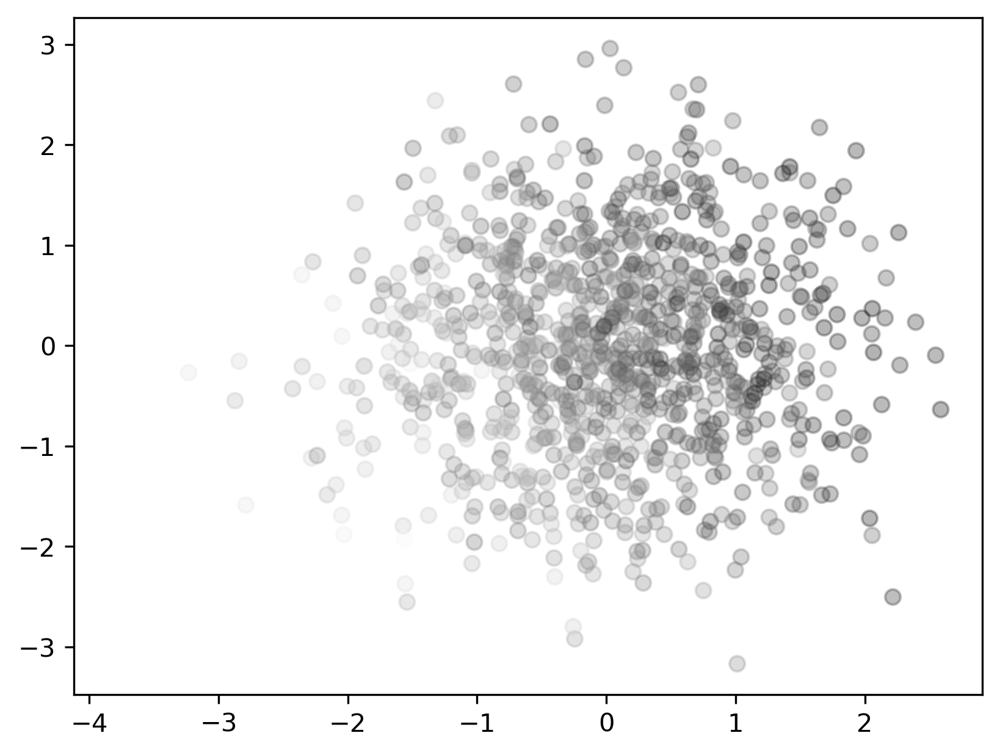

In [14]:
X, y = make_regression(n_samples=1000, n_features=3, noise=0.2,
                       random_state=123)

plt.scatter(X[:, 0], X[:, 1], alpha= 0.3, cmap='Greys', c=y)

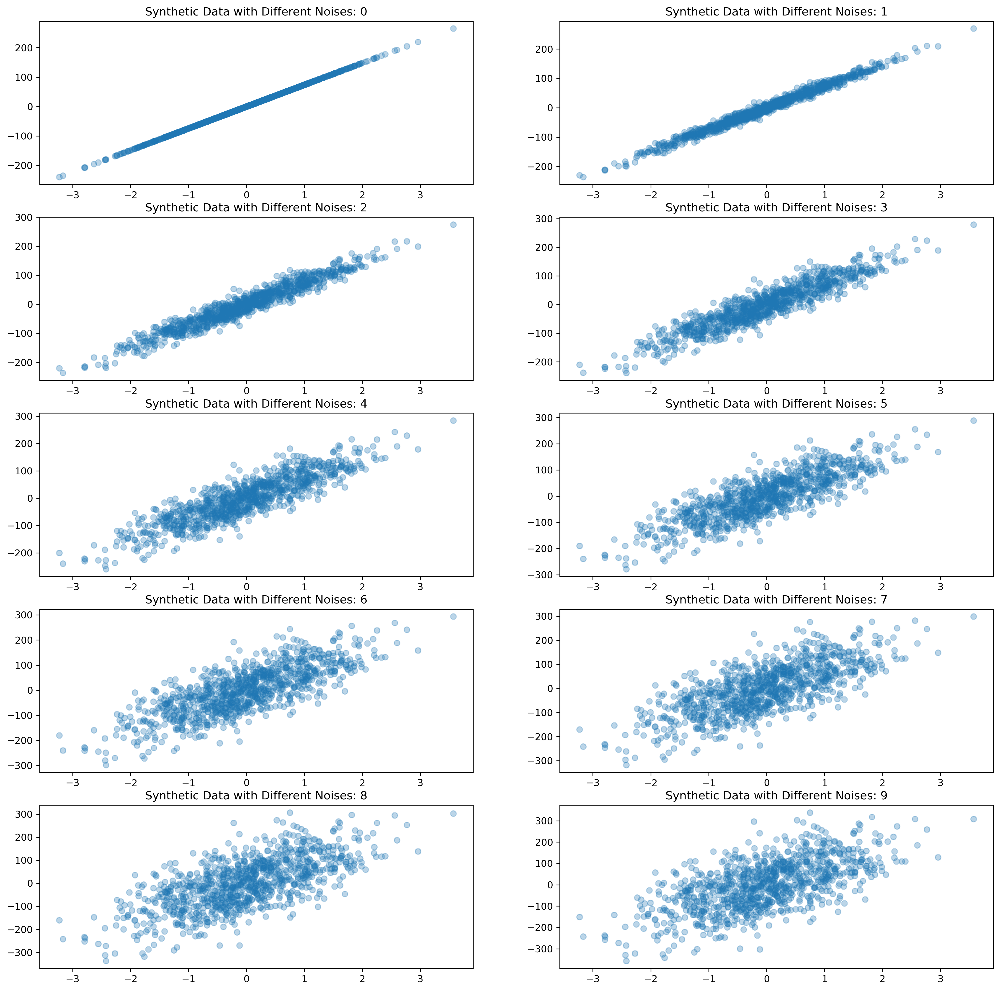

In [15]:
plt.figure(figsize=(18, 18))
k = 0

for i in range(0, 10):
    X, y = make_regression(n_samples=1000, n_features=1, noise=i*10,
                           random_state=123) 
    k+=1
    plt.subplot(5, 2, k)
    plt.scatter(X, y, alpha=0.3, cmap=cm.Accent)
    plt.title('Synthetic Data with Different Noises: ' + str(i))
plt.show()

In [16]:
from sklearn.datasets import make_classification

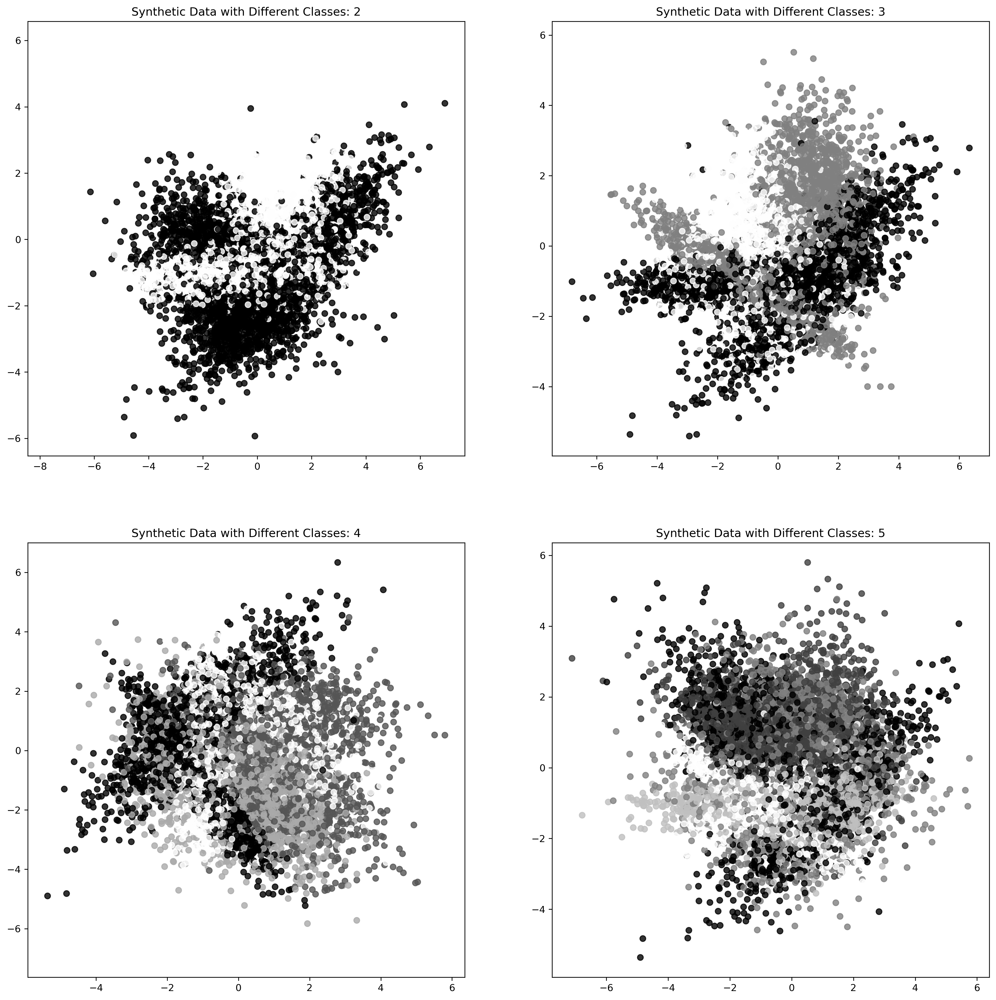

In [64]:
plt.figure(figsize=(18, 18))
k = 0

for i in range(2, 6):
    X, y = make_classification(n_samples=10000,
                               n_features=4,
                               n_classes=i,
                               n_redundant=0,
                               n_informative=4,
                               random_state=123)
    k+=1
    plt.subplot(2, 2, k)
    plt.scatter(X[: ,0], X[:, 1], alpha=0.8, cmap='gray', c=y)
    plt.title('Synthetic Data with Different Classes: ' + str(i))
plt.show()

## Synthetic Data for Unsupervised Learning

`make_blobs`는 비지도 학습을 위해 합성 데이터를 생성하는 패키지이다.

In [59]:
from sklearn.datasets import make_blobs

In [62]:
X, y = make_blobs(n_samples=10000, centers=2, 
                      n_features=2, random_state=0)

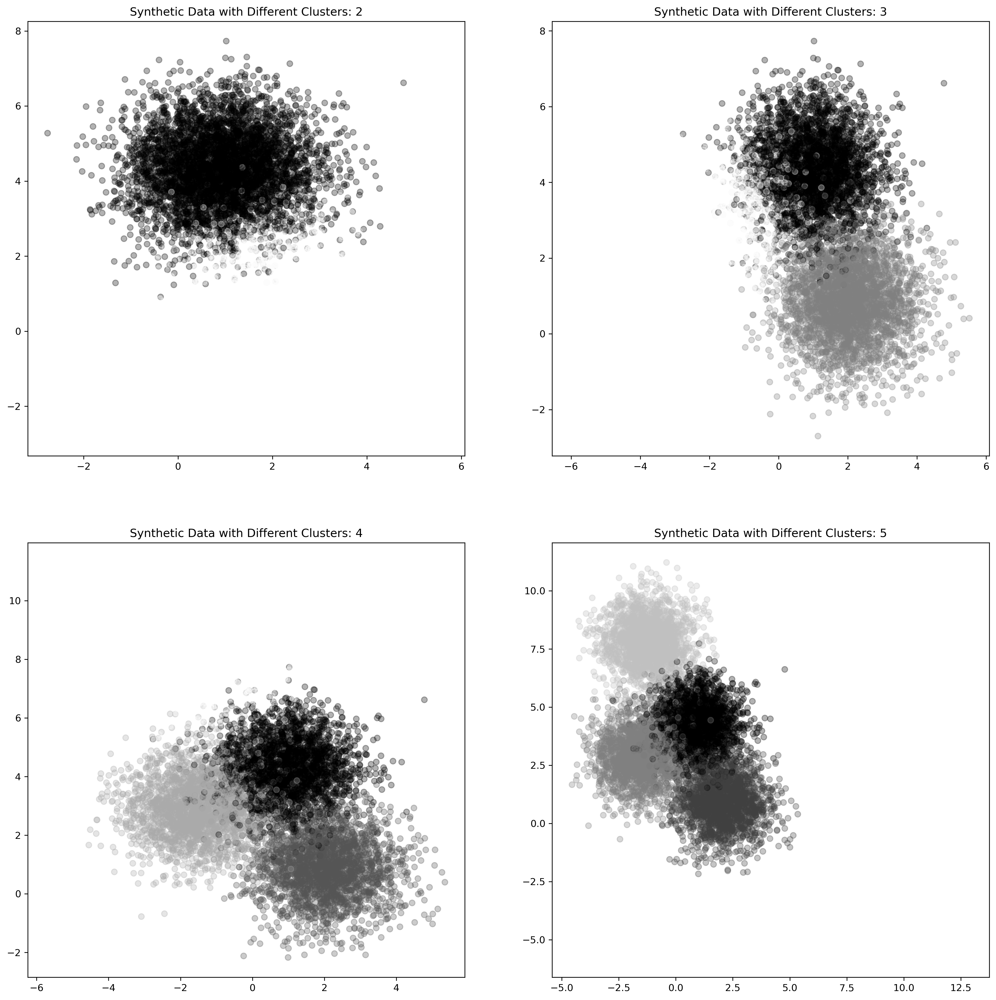

In [63]:
plt.figure(figsize=(18, 18))
k = 0
for i in range(2, 6):
    X, y = make_blobs(n_samples=10000, centers=i,
                      n_features=2, random_state=0)
    k += 1
    plt.subplot(2, 2, k)
    my_scatter_plot = plt.scatter(X[:, 0], X[:, 1],
                                  alpha=0.3, cmap='gray', c=y)
    plt.title('Synthetic Data with Different Clusters: ' + str(i))
plt.show()

## HMM

은닉 마르코프 모형(hidden Markov model, HMM)은 마르코프 모형 중 하나다. 

### 마르코프 모형

마르코프 모형은 현재 상태가 과거 상태에만 의존해 결정되는 프로세스를 의미한다. 가장 간단한 예시인 1차 마르코프 모델을 수식으로 서술하면 다음과 같다.

$$
P(C_{t+1} \mid C_t, \cdots, C_1) = P(C_{t+1} \mid C_t)
$$

즉, 현재 값이 과거 1기 전의 값에만 의존한다는 것을 의미한다. 이를 확장한 2차 마르코프 모델은 다음과 같다.

$$
P(C_{t+1} \mid C_t, \cdots, C_1) = P(C_{t+1} \mid C_t, C_{t-1})
$$


마르코프 모델에서 과거의 모든 상태 조합에 대해 현재 상태로 전이될 확률을 나타낸 것이 전이 확률 행렬(Transition Probability Matirx)이다.

$$
\Gamma(t) = \{ \gamma_{ij}(t) \}, \;\;\; \Gamma = \Gamma(1)
$$

체프먼-콜모고로프 방정식(Chapman-Kolmogorov Equation에 의하면 시간 $t+u$ 의 전이확률행렬은 시간 $t$ 의 전이확률행렬과 시간 $u$ 의 전이확률행렬의 곱으로 나타난다.

$$
 \Gamma(t+u) = \Gamma(t)\Gamma(u)
$$

### 은닉 마르코프 모형

은닉 마르코프 모형(Hidden Markov Model)은 마르코프 확률 과정 $C_t$와 해당 확률 과정에 의존해 값이 결정되는 $X_t$가 존재하는데, $X_t$ 만 측정 가능하고 이산 확률 과정의 값 $C_t$ 는 측정할 수 없는 모형을 의미한다.

$$
P(C_t | C_{t-1}, \cdots, C_1) = P(C_t \mid C_{t-1})
$$

$$
P(X_t \mid X_t, \cdots, X_1, C_t, \cdots, C_1) = P(X_t \mid C_t)
$$


따라서, 은닉 마르코프 모형에서 추정해야 할 파라미터는 다음과 같이 요약된다.

1. 전이 확률 행렬(State transition prabability matrix) : 과거 hidden state에서 현재 hidden state로 전이될 확률을 나타냄

2. 방출확률 행렬(Emission probability matrix) : hidden state에서 Observable state로 전이될 확률을 나타냄

3. 초기 상태 행렬(initial state probability matrix) : 초기에 어떤 hidden state를 가질지 나타냄

은닉 마르코프 모델을 다루는 문제는 크게 3가지로 구분된다.

1. HMM의 세 파라미터가 주어지고, 관측한 Observable state 시계열이 주어질 때, 해당 Observable state가 등장할 확률을 구하라 => Evaluation problem

2. HMM의 세 파라미터가 주어지고, 관측한 Observable state 시계열이 주어질 때, optimal hidden state sequence를 구하라 => Decoding problem

3. 관측한 Observable state 시계열이 주어질 때, HMM의 세 파라미터를 구하라 => Learning problem

특히 Learning problem의 경우, 관측 벡터 O가 주어질 때 해당 벡터의 등장 확률을 극대화하는 파라미터 $\lambda$를 찾는 것을 목표로 한다.

즉, $$HMM(\lambda^*)=\argmax_{\lambda} P[O\vert \lambda]$$

문제를 푸는 것과 동일하다. 이를 위해 최대우도법과 `Baum-Welch Algorithm`을 사용한다. 이는 사실 expectation–maximization (EM) algorithm의 일종이다.

자세한 내용은 https://youtu.be/P02Lws57gqM?si=DhV-4t8g2AHK3IlC 강의를 참고하자

그렇다면 HMM을 어떻게 금융에 활용할 수 있을까? 핵심 아이디어는 다음과 같다. 상승, 하락, 유지의 세 가지 상태로 정의되는 주식 시장을 생각해 보자. 그렇다면, 주식 시장의 시계열적 특성으로 인해 다음날의 특성은 현재 특성에 의해 결정될 것이다. 하지만 다음으로 우세할 상태가 무엇일지는 확실하지 않기 때문에 은닉 상태로 간주된다. 이를 바탕으로 HMM을 구현할 수 있다.

여기서는 Fama–French three-factor model을 바탕으로 한다. 해당 모델을 실행하기 전에 상태를 식별하면 모델의 성능을 높일 수 있다고 알려져 있다. 이를 실제 데이터를 바탕으로 실험해보자.

In [21]:
ff = pd.read_csv('./data/FF3.csv', skiprows=4)
ff = ff.rename(columns={'Unnamed: 0': 'Date'})
ff = ff.iloc[:-1]
ff.head()

,Date,Mkt-RF,SMB,HML,RF
0,19260701,0.10,-0.24,-0.28,0.009
1,19260702,0.45,-0.32,-0.08,0.009
2,19260706,0.17,0.27,-0.35,0.009
3,19260707,0.09,-0.59,0.03,0.009
4,19260708,0.21,-0.36,0.15,0.009


In [22]:
ff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24978 entries, 0 to 24977
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    24978 non-null  object 
 1   Mkt-RF  24978 non-null  float64
 2   SMB     24978 non-null  float64
 3   HML     24978 non-null  float64
 4   RF      24978 non-null  float64
dtypes: float64(4), object(1)
memory usage: 975.8+ KB


In [23]:
ff['Date'] = pd.to_datetime(ff['Date'])
ff.set_index('Date', inplace=True)
ff_trim = ff.loc['2000-01-01':]

In [24]:
ff_trim.head()

,Mkt-RF,SMB,HML,RF
Date,,,,
2000-01-03,-0.71,0.61,-1.40,0.021
2000-01-04,-4.06,0.01,2.06,0.021
2000-01-05,-0.09,0.18,0.19,0.021
2000-01-06,-0.73,-0.42,1.27,0.021
2000-01-07,3.21,-0.49,-1.42,0.021


다음으로는 시장 수익률을 대변할 수 있는 정보를 받아오자. 이를 위해서 S&P500을 사용하자.

In [25]:
ticker = 'SPY'
start = datetime.datetime(2000, 1, 3)
end = datetime.datetime(2021, 4, 30)
SP_ETF = yf.download(ticker, start, end, interval='1d').Close

[*********************100%%**********************]  1 of 1 completed


In [26]:
ff_merge = pd.merge(ff_trim, SP_ETF, how='inner', on='Date')

In [27]:
SP = pd.DataFrame()
SP['Close']= ff_merge['Close']

In [28]:
SP['return'] = (SP['Close'] / SP['Close'].shift(1))-1

이제 경제에 상승, 하락, 유지 세 가지 상태가 있다고 가정하고 완전한 공분산을 이용해 HMM을 실행한다. 다음 코드는 가우스 HMM을 적용하고 은닉 상태를 예측하는 코드이다. 즉, hidden state는 상승, 하락, 유지 세가지 상태로 정리되며, 수익률이 해당 hidden state에 의해 결정되는 Observable data가 되는 것이다.

In [29]:
from hmmlearn import hmm

In [30]:
hmm_model = hmm.GaussianHMM(n_components=3,
                            covariance_type="full",
                            n_iter=10000)

In [31]:
hmm_model.fit(np.array(SP['return'].dropna()).reshape(-1, 1))
hmm_predict = hmm_model.predict(np.array(SP['return'].dropna())
                                .reshape(-1, 1))
df_hmm = pd.DataFrame(hmm_predict)

Model is not converging.  Current: 17122.72187733715 is not greater than 17122.723468789198. Delta is -0.0015914520481601357


In [32]:
ret_merged = pd.concat([df_hmm,SP['return'].dropna().reset_index()],
                       axis=1)
ret_merged.drop('Date',axis=1, inplace=True)
ret_merged.rename(columns={0:'states'}, inplace=True)
ret_merged.dropna().head()

,states,return
0,2,-0.039106
1,2,0.001789
2,2,-0.016071
3,2,0.058076
4,2,0.003431


In [33]:
ret_merged['states'].value_counts()

states
0    3623
2    1484
1     257
Name: count, dtype: int64

In [34]:
state_means = []
state_std = []

for i in range(3):
    state_means.append(ret_merged[ret_merged.states == i]['return']
                       .mean())
    state_std.append(ret_merged[ret_merged.states == i]['return']
                     .std())
print('State Means are: {}'.format(state_means))
print('State Standard Deviations are: {}'.format(state_std))

State Means are: [0.0012240487741692148, -0.007144245437795174, -0.0007532187269928217]
State Standard Deviations are: [0.005926265494550529, 0.01653494009868869, 0.020502565240914986]


앞서 말했듯 추정되는 변수는 초기 확률, 전이 확률, 그리고 방출 확률 행렬이다. 하지만 가우시안HMM의 경우, 방출 확률이 가우시안 분포를 따른다고 가정한다. 따라서 추정해야 하는 행렬이 초기 확률 행렬과 전이 확률 행렬로 압축된다.

In [35]:
print(f'HMM means\n {hmm_model.means_}')
print(f'HMM covariances\n {hmm_model.covars_}')
print(f'HMM transition matrix\n {hmm_model.transmat_}')
print(f'HMM initial probability\n {hmm_model.startprob_}')

HMM means
 [[ 0.00117022]
 [-0.001664  ]
 [-0.00091316]]
HMM covariances
 [[[4.17554161e-05]]

 [[1.57695722e-04]]

 [[4.84993000e-04]]]
HMM transition matrix
 [[7.89143318e-01 2.10062151e-01 7.94531226e-04]
 [8.85403615e-01 7.76124697e-02 3.69839152e-02]
 [9.13775347e-03 1.73231659e-02 9.73539081e-01]]
HMM initial probability
 [0. 0. 1.]


그렇다면 정말로 경제에 3 가지 상태만 존재할까? 이를 검증하기 위해 엘보우 분석을 활용할 수 있다. 가우스 HMM을 이용한 뒤, 우도 결과를 바탕으로 최적의 상태 수를 확인하는 것이다.

Text(0, 0.5, 'Log Likelihood')

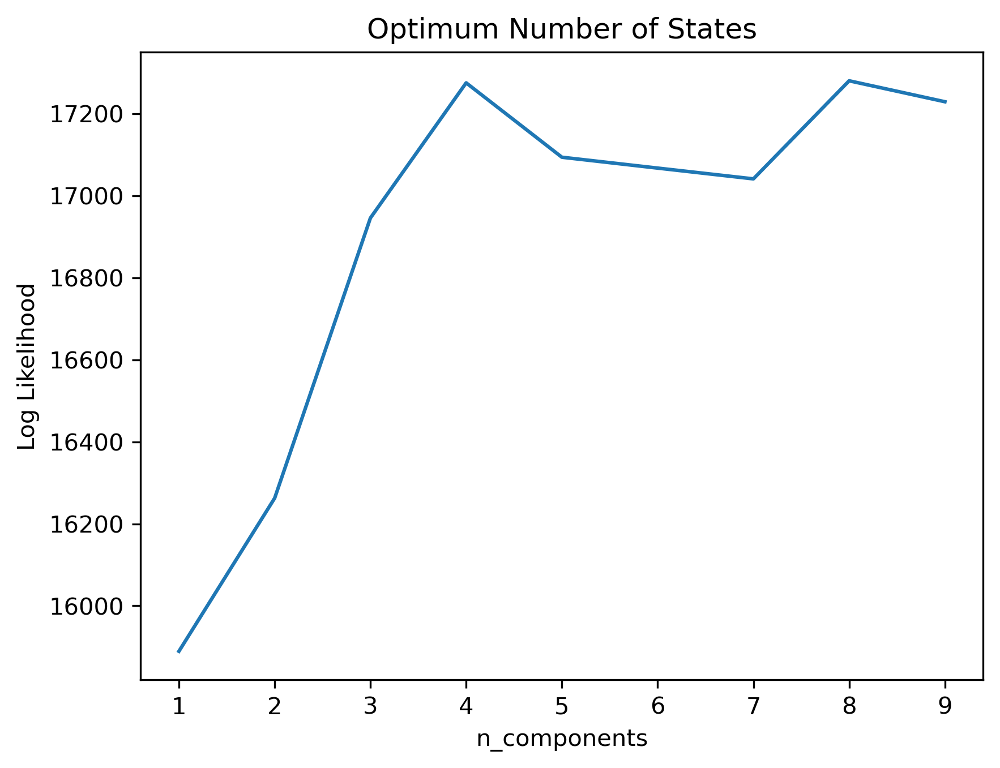

In [36]:
sp_ret = SP['return'].dropna().values.reshape(-1,1)
n_components = np.arange(1, 10)
clusters = [hmm.GaussianHMM(n_components=n, 
                            covariance_type="full").fit(sp_ret)
           for n in n_components]
plt.plot(n_components, [m.score(np.array(SP['return'].dropna())\
                                .reshape(-1,1)) for m in clusters])
plt.title('Optimum Number of States')
plt.xlabel('n_components')
plt.ylabel('Log Likelihood')

3번째 구성 요소 이후로 우도가 크게 좋아지지 않으므로 상태를 3개로 선택하는 것은 좋은 판단이다.

In [37]:
hmm_model = hmm.GaussianHMM(n_components=3, 
                        covariance_type="full", 
                        random_state=123).fit(sp_ret)
hidden_states = hmm_model.predict(sp_ret)

In [38]:
from matplotlib.dates import YearLocator, MonthLocator
from matplotlib import cm

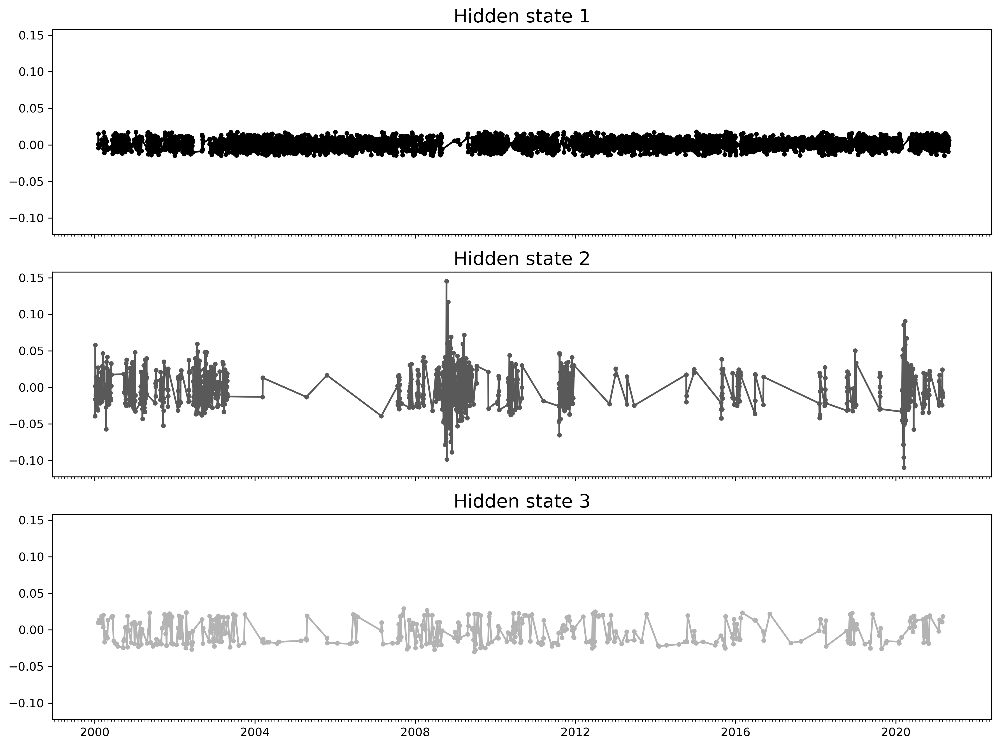

In [39]:
df_sp_ret = SP['return'].dropna()

hmm_model = hmm.GaussianHMM(n_components=3, 
                            covariance_type="full", 
                            random_state=123).fit(sp_ret)

hidden_states = hmm_model.predict(sp_ret)

fig, axs = plt.subplots(hmm_model.n_components, sharex=True,
                        sharey=True, figsize=(12, 9))
colors = cm.gray(np.linspace(0, 0.7, hmm_model.n_components))

for i, (ax, color) in enumerate(zip(axs, colors)):
    mask = hidden_states == i
    ax.plot_date(df_sp_ret.index.values[mask],
                 df_sp_ret.values[mask],
                 ".-", c=color)
    ax.set_title("Hidden state {}".format(i + 1), fontsize=16)
    ax.xaxis.set_minor_locator(MonthLocator())
plt.tight_layout()

이는 각 상태(상승, 하락, 중립)에 따라 수익률의 분포가 다르다는 것을 보여준다.

In [40]:
ret_merged.groupby('states')['return'].mean()

states
0    0.001224
1   -0.007144
2   -0.000753
Name: return, dtype: float64

## Fama-French Model vs. HMM

다음은 선형 회귀를 이용한 모델과 HMM을 이용한 모델을 비교하는 과정이다.

In [41]:
ff_merge['return'] = ff_merge['Close'].pct_change()
ff_merge.dropna(inplace=True)

In [42]:
split = int(len(ff_merge) * 0.9)
train_ff= ff_merge.iloc[:split].dropna()
test_ff = ff_merge.iloc[split:].dropna()

In [43]:
hmm_model = hmm.GaussianHMM(n_components=3,
                            covariance_type="full",
                            n_iter=10000, init_params=" ")

In [44]:
predictions = []

for i in range(len(test_ff)):
    hmm_model.fit(train_ff)
    adjustment = np.dot(hmm_model.transmat_, hmm_model.means_)
    predictions.append(test_ff.iloc[i] + adjustment[0])
predictions = pd.DataFrame(predictions)

In [45]:
std_dev = predictions['return'].std()
sharpe = predictions['return'].mean() / std_dev
print('Sharpe ratio with HMM is {:.4f}'.format(sharpe))

Sharpe ratio with HMM is 0.0499


## Fama-French Model with OLS

In [46]:
import statsmodels.api as sm

In [47]:
Y = train_ff['return']
X = train_ff[['Mkt-RF', 'SMB', 'HML']]

In [48]:
model = sm.OLS(Y, X)
ff_ols = model.fit()
print(ff_ols.summary())

                                 OLS Regression Results                                
Dep. Variable:                 return   R-squared (uncentered):                   0.962
Model:                            OLS   Adj. R-squared (uncentered):              0.962
Method:                 Least Squares   F-statistic:                          4.072e+04
Date:                Mon, 10 Feb 2025   Prob (F-statistic):                        0.00
Time:                        16:13:31   Log-Likelihood:                          22347.
No. Observations:                4827   AIC:                                 -4.469e+04
Df Residuals:                    4824   BIC:                                 -4.467e+04
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [49]:
ff_pred = ff_ols.predict(test_ff[["Mkt-RF", "SMB", "HML"]])
ff_pred.head()

Date
2019-03-14   -0.000340
2019-03-15    0.005178
2019-03-18    0.004273
2019-03-19   -0.000194
2019-03-20   -0.003795
dtype: float64

In [50]:
std_dev = ff_pred.std()
sharpe = ff_pred.mean() / std_dev
print('Sharpe ratio with FF 3 factor model is {:.4f}'.format(sharpe))

Sharpe ratio with FF 3 factor model is 0.0589


In [51]:
split = int(len(SP['return']) * 0.9)
train_ret_SP = SP['return'].iloc[split:].dropna()
test_ret_SP = SP['return'].iloc[:split].dropna()

In [52]:
hmm_model = hmm.GaussianHMM(n_components=3,
                            covariance_type="full",
                            n_iter=100)
hmm_model.fit(np.array(train_ret_SP).reshape(-1, 1))
hmm_predict_vol = hmm_model.predict(np.array(test_ret_SP)
                                    .reshape(-1, 1))
pd.DataFrame(hmm_predict_vol).value_counts()

Model is not converging.  Current: 1646.7485415937945 is not greater than 1646.7553414102717. Delta is -0.006799816477268905


2    2288
1    2281
0     258
Name: count, dtype: int64

## Synthetic Data Generation and Hidden Markov

여기서는 가우스 HMM을 이용해 합성 데이터를 만드는 프로세스를 소개한다. 우선, 초기 매개변수를 정의한다.

In [53]:
startprob = hmm_model.startprob_  # 초기 확률
transmat = hmm_model.transmat_   # 전이 행렬
means = hmm_model.means_    # 평균
covars = hmm_model.covars_   # 공분산

In [54]:
syn_hmm = hmm.GaussianHMM(n_components=3, covariance_type="full")

In [55]:
syn_hmm.startprob_ = startprob
syn_hmm.transmat_ = transmat 
syn_hmm.means_ = means 
syn_hmm.covars_ = covars

In [56]:
syn_data, _ = syn_hmm.sample(n_samples=1000)

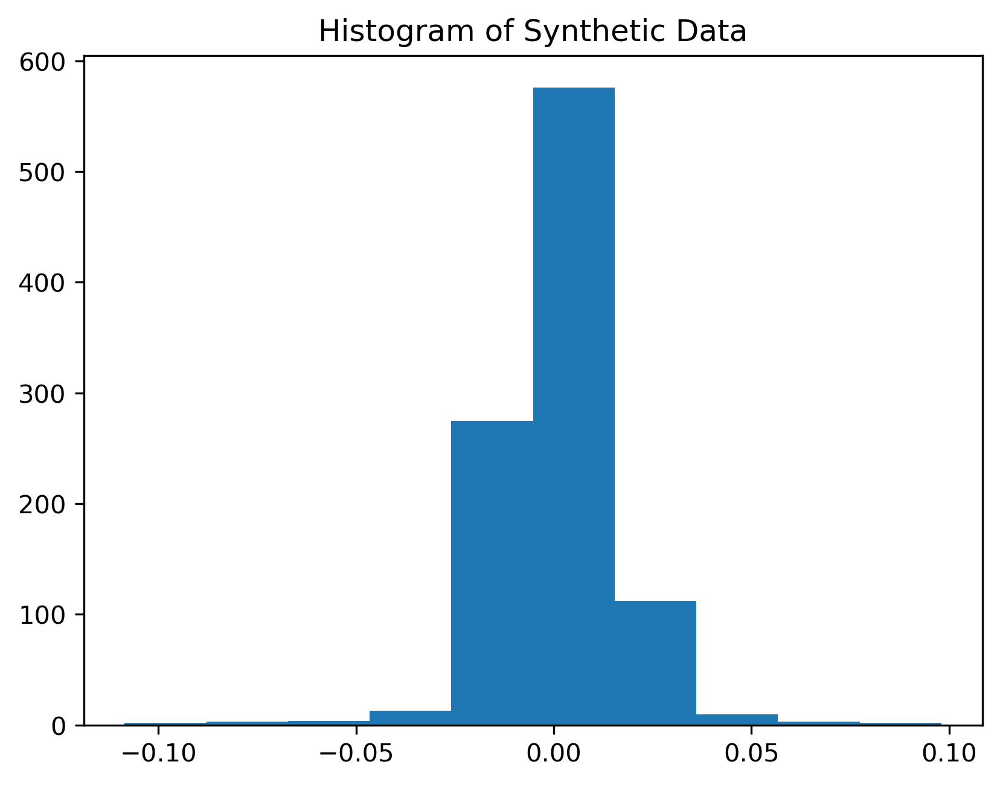

In [57]:
plt.hist(syn_data)
plt.title('Histogram of Synthetic Data')
plt.show()

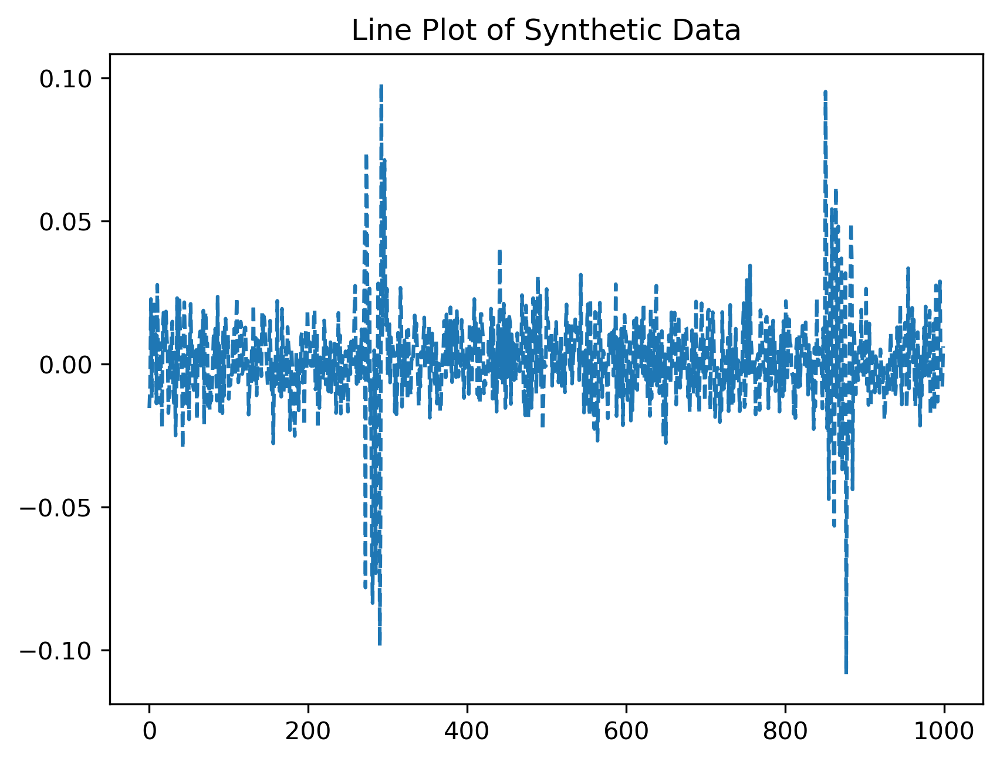

In [58]:
plt.plot(syn_data, "--")
plt.title('Line Plot of Synthetic Data')
plt.show()